# Project 2

Student: Kesav Adithya Venkidusamy <br>
Course: DSC680 - Applied Data Science <br>
Instructor: Professor Catherine Williams <br>
Assignment: Project 2

## Life Expectancy Prediction

<b>Idea</b>: Everything has an expiration date; humans are no exception either. The term “life expectancy” refers to the number of years a person can expect to live. By definition, life expectancy is based on an estimate of the average age that members of a particular population group will be when they die. 
We’re in an unprecedented era where humans are living longer with increased access to modern science and healthcare. It’s no secret, though, that life expectancy varies widely across the globe. Life expectancy depends on several factors, the two most important being gender and birth year. Generally, females have a slightly higher life expectancy than males due to biological differences. Other factors that influence life expectancy include:

 - Race and ethnicity
 - Family medical history
 - Risky lifestyles

In this project, I aim to explore the parameters affecting the life span of individuals living in distinct countries and learn how the life span can be estimated with the help of machine learning models. I will also focus on exploring the parameters that greatly impact the life span of an individual.

<b>Dataset</b>
The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status as well as many other related factors of all countries. The datasets are made available to the public for health data analysis. 

https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who

The data-set related to life expectancy, and health factors for 193 countries have been collected from the same WHO data repository website and its corresponding economic data was collected from the United Nation website.  

<b>Abstract</b>: Predict the key drivers for the Life Expectancy

#### Features and Target present in the dataset

1. Country - Country Observed
2. Year - Year Observed
3. Status - Status of the country; Developed or Developing Status
4. Adult Mortality - Adult Mortality Rates on both sexes (probability of dying between 15-60 years/1000 population).
5. Infant deaths - Number of Infant Deaths per 1000 population
6. Alcohol - Alcohol recorded per capita (15+) consumption (in liters of pure alcohol).
7. Percentage expenditure - Expenditure on health as a percentage of Gross Domestic Product per capita(%).
8. Hepatitis B - Hepatitis B (HepB) immunization coverage among 1-year-olds (%)
9. Measles - Number of reported Measles cases per 1000 population
10. BMI - Average Body Mass Index of the entire population
11. Under-five-deaths - Number of under-five deaths per 1000 population
12. Polio - Polio (Pol3) immunization coverage among 1-year-olds (%)
13. Total expenditure - General government expenditure on health as a percentage of total government expenditure (%)
14. Diphtheria - Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)
15. HIV/AIDS - Deaths per 1 000 live births HIV/AIDS (0-4 years)
16. GDP - Gross Domestic Product per capita (in USD)
17. Population - The population of the country
18. thinness 1-19 years - Prevalence of thinness among children and adolescents for Age 10 to 19 (%)
19. thinness 5-9 years - Prevalence of thinness among children for Age 5 to 9(%)
20. Income composition of resources - Human Development Index in terms of income composition of resources (index ranging from 0 to 1)
21. Schooling - Number of years of Schooling(years)

Target:

Life expectancy — Life expectancy in age

### Data Exploration

##### Importing libraries for data processing

In [1]:
#GENERAL
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np # linear algebra
import random

#VISUALIZATIONS
import seaborn as sns 
import matplotlib.pyplot as plt
import missingno as msno
import plotly.express as px
from plotly.subplots import make_subplots
from scipy.stats import kstest, norm
import pycountry

#FEATURE EGNGG
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.base import BaseEstimator, TransformerMixin

#MODEL
## Importing lib required for modeling
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, r2_score

#General
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
import plotly.io as pio
pio.renderers.default='notebook'
from IPython.display import Image

##### Source Data Analysis

In [2]:
## Reading input data and create dataframe
raw_df = pd.read_csv('Life_Expectancy_Data.csv')

In [3]:
## Showing few records from the dataframe using head command
raw_df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
## showing the shape of the dataframe
raw_df.shape

(2938, 22)

The dataset contains 2938 rows and 22 attributes!

In [5]:
## Showing the info of the dataframe
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [6]:
## Describe the numerical columns present in the dataframe
raw_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life expectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
Adult Mortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis B,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


##### Observation

- The data has around 15 years of data with Year range from 2000 to 2015

- The Adult Mortality column has a minimum value of 1 and maximum value of 74

- The infant deaths field has a range from 0 to 1800

- The Alchohol consumption ranges between 0.01 to 17.87

- The percentage expenditure has a range of values from 0 to 19479; Total expenditure field has a minimum value of 0.37 and max value of 17.6 

- Hepatitis B column has numerical values between 1 and 99. This field has lot of null values.

- Measles field has a range of values between 0 and 212183 

- BMI field has range of values from 1 to 87.3. It has few blank values.

- under-five deaths is a continous variable with range from 0 to 2500.

- Polio and Diphtheria are continuous variables denoting the immunization records. The range of values are between 3 and 99 and 2 nd 99 respectively.

- HIV/AIDS field (Deaths per 1 000 live births HIV/AIDS) has range of values from 0.1 to 50.6

- GDP and Population fields are also continuous variables which min value of 1.68135 and 34 respectively and max value of 119172.7 and 1.293859e+09 respectively.

- "thinness 1-19 years" and "thinness 5-9 years" fields denote Prevalence of thinness among children and the values range between 0.10 and 2.770000e+01 and 0.1 and 2.860000e+01 respectively.

- Schooling is also continuous variable with values between 0 and 20.7

One interesting thing in this dataset is that the names of the columns are not written in a nice manner, like in some names there is a space before the name, in some after the name and in some names there is a space in both before and after the name like " BMI ". To tackle this, let's print the names of all the columns and rename space with underscore.

In [7]:
## Renaming the fields
raw_df.columns.values.tolist()

['Country',
 'Year',
 'Status',
 'Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'GDP',
 'Population',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

In [8]:
## Renaming the columns with space
raw_df.rename(columns={'Life expectancy ': 'Life_expectancy', 
                       'Adult Mortality': 'Adult_Mortality',
                       'infant deaths':'infant_deaths',
                       'percentage expenditure':'percentage_expenditure',
                       'Hepatitis B':'Hepatitis_B','Measles ':'Measles',
                       ' BMI ':'BMI',
                       'under-five deaths ':'under_five_deaths',
                       'Total expenditure':'Total_expenditure','Diphtheria ':'Diphtheria',
                       ' HIV/AIDS':'HIV/AIDS',
                       ' thinness  1-19 years':'thinness_1_19_years',
                       ' thinness 5-9 years': 'thinness_5_9_years',
                       'Income composition of resources':'Income_composition_of_resources'}, inplace=True)

In [9]:
## Printing after renaming the fields
raw_df.columns.values.tolist()

['Country',
 'Year',
 'Status',
 'Life_expectancy',
 'Adult_Mortality',
 'infant_deaths',
 'Alcohol',
 'percentage_expenditure',
 'Hepatitis_B',
 'Measles',
 'BMI',
 'under_five_deaths',
 'Polio',
 'Total_expenditure',
 'Diphtheria',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness_1_19_years',
 'thinness_5_9_years',
 'Income_composition_of_resources',
 'Schooling']

In [10]:
## Analyzing the target variable
raw_df['Life_expectancy'].value_counts()

73.0    45
75.0    33
78.0    31
73.6    28
81.0    25
        ..
41.5     1
83.3     1
49.5     1
39.0     1
55.2     1
Name: Life_expectancy, Length: 362, dtype: int64

#### Observation

The "Life_expectancy" column is our target variable which is continuous in nature having range of values between 36.3 and 89.

In [11]:
## Printing the info of the dataframe
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life_expectancy                  2928 non-null   float64
 4   Adult_Mortality                  2928 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   Hepatitis_B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  under_five_deaths                2938 non-null   int64  
 12  Polio               

In [12]:
## Identifying the numerical columns in the dataset
num_cols = raw_df.select_dtypes(include=[np.float64, np.int64]).columns.tolist()
print(num_cols)

['Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling']


In [13]:
## Identifying categorical variables in the dataset
cat_cols = raw_df.select_dtypes('object').columns.tolist()
print(cat_cols)

['Country', 'Status']


In [14]:
## Copying the dataframe to another dataframe
rename_raw_df = raw_df.copy(deep=True)

In [15]:
## Printing few values from copied dataframe
rename_raw_df.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


## EDA

In [16]:
## Analyzing all the categorical variables;
## Printing all the unique values of the categorical variables
## Summary of categorical variables
cat_df=pd.DataFrame(rename_raw_df[cat_cols].melt(var_name='column', value_name='value')
                    .value_counts()).rename(columns={0: 'count'}).sort_values(by=['column', 'count'])
display(rename_raw_df.select_dtypes(include=object).describe())
display(cat_df)

,Country,Status
count,2938,2938
unique,193,2
top,Iran (Islamic Republic of),Developing
freq,16,2426


count
column  value                       
Country Saint Kitts and Nevis      1
        Marshall Islands           1
        Monaco                     1
        Tuvalu                     1
        Nauru                      1
...                              ...
        Germany                   16
        Ghana                     16
        Japan                     16
Status  Developed                512
        Developing              2426

[195 rows x 1 columns]

In [17]:
## Printing unique value count for all the variables
print("All columns Unique values count")
for col in rename_raw_df:
    print(col, len(rename_raw_df[col].unique()), sep=': ')

All columns Unique values count
Country: 193
Year: 16
Status: 2
Life_expectancy: 363
Adult_Mortality: 426
infant_deaths: 209
Alcohol: 1077
percentage_expenditure: 2328
Hepatitis_B: 88
Measles: 958
BMI: 609
under_five_deaths: 252
Polio: 74
Total_expenditure: 819
Diphtheria: 82
HIV/AIDS: 200
GDP: 2491
Population: 2279
thinness_1_19_years: 201
thinness_5_9_years: 208
Income_composition_of_resources: 626
Schooling: 174


#### Handling Null Values

In [18]:
## Printing list of null values present in each column
rename_raw_df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life_expectancy                     10
Adult_Mortality                     10
infant_deaths                        0
Alcohol                            194
percentage_expenditure               0
Hepatitis_B                        553
Measles                              0
BMI                                 34
under_five_deaths                    0
Polio                               19
Total_expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness_1_19_years                 34
thinness_5_9_years                  34
Income_composition_of_resources    167
Schooling                          163
dtype: int64

Missing values can prove to be a major pain as they may affect the run of the algorithms as almost all the algorithms expect the full data but return error if some points are missing. So, cleaning the data is essential!

<AxesSubplot:>

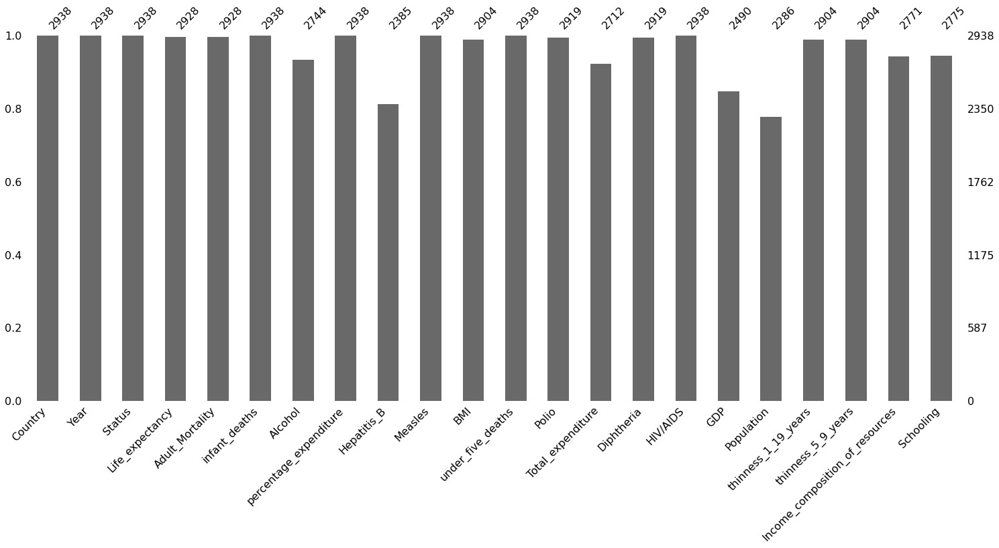

In [19]:
# using missingno library to get a feel of the missing entries
msno.bar(rename_raw_df)

##### Observation

From the above bar chart, I can see that many attributes have missing values, like Hepatitis B has 2385 values, whereas the expected number of values for every attribute is 2938. Now we have to find a way to fill in all these missing values as these may cause problems for our algorithm. We'll use the impute method of pd.DataFrame.fillna and impute the previous values in all these missing fields, previous values can be a good way to fill in such entries.

In [20]:
#### Replace null values with forward fill for all null value fields.
rename_raw_df["Hepatitis_B"].fillna( method ='ffill', inplace = True)
rename_raw_df["Alcohol"].fillna( method ='ffill', inplace = True)
rename_raw_df["Adult_Mortality"].fillna( method ='ffill', inplace = True)
rename_raw_df["Polio"].fillna( method ='ffill', inplace = True)
rename_raw_df["Total_expenditure"].fillna( method ='ffill', inplace = True)
rename_raw_df["GDP"].fillna( method ='ffill', inplace = True)
rename_raw_df["Population"].fillna( method ='ffill', inplace = True)
rename_raw_df["Schooling"].fillna( method ='ffill', inplace = True)
rename_raw_df["Income_composition_of_resources"].fillna( method ='ffill', inplace = True)
rename_raw_df["Life_expectancy"].fillna( method ='ffill', inplace = True)
rename_raw_df["Diphtheria"].fillna( method ='ffill', inplace = True)
rename_raw_df["thinness_5_9_years"].fillna( method ='ffill', inplace = True)
rename_raw_df["thinness_1_19_years"].fillna( method ='ffill', inplace = True)
rename_raw_df["BMI"].fillna( method ='ffill', inplace = True)

<AxesSubplot:>

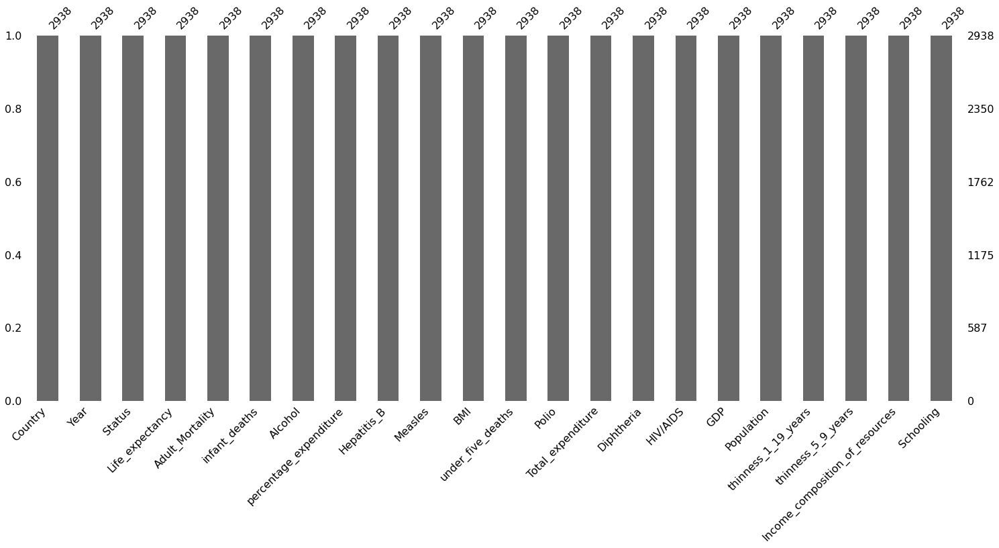

In [21]:
# using missingno library to get a feel of the missing entries after null value replacement
msno.bar(rename_raw_df)

#### Duplicate check

In [22]:
# Selecting duplicate rows
# occurrence based on all columns
duplicate = rename_raw_df[rename_raw_df.duplicated()]
duplicate

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling


###### Observation

There is no duplicate value present in the dataframe

In [23]:
## Creating a final dataframe
life_exp_df = rename_raw_df.copy(deep=True)

In [24]:
## Printing few records from life_exp_df
life_exp_df.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [25]:
## Displaying the Categorical and numerical columns
life_exp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life_expectancy                  2938 non-null   float64
 4   Adult_Mortality                  2938 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   Hepatitis_B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2938 non-null   float64
 11  under_five_deaths                2938 non-null   int64  
 12  Polio               

In [26]:
## Identifying the numerical columns in the dataset
print("Numberical Columns")
print(num_cols)

print("\nCategorical Columns")
print(cat_cols)

Numberical Columns
['Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling']

Categorical Columns
['Country', 'Status']


### Visualizations

#### Numerical Variable Exploration

#### Histogram

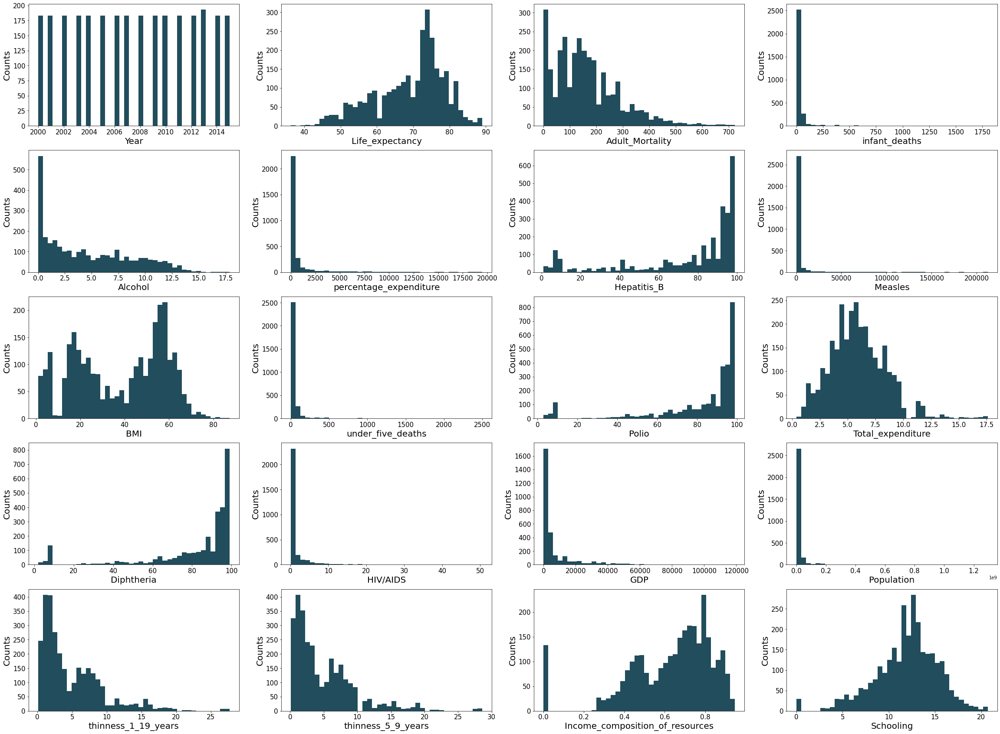

In [27]:
## Make some histograms of your data
## Specify the features of interest
features = ['Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling']
xaxes = features
yaxes = ['Counts', 'Counts', 'Counts', 'Counts', 'Counts', 'Counts','Counts','Counts','Counts','Counts','Counts','Counts','Counts', 'Counts', 'Counts', 'Counts', 'Counts', 'Counts','Counts','Counts']
# set up the figure size
plt.rcParams['figure.figsize'] = (40, 30)
# make subplots
fig, axes = plt.subplots(nrows = 5, ncols = 4)
# draw histograms
axes = axes.ravel()
for idx, ax in enumerate(axes):
    ax.hist(life_exp_df[features[idx]].dropna(), bins=40, color='#214D5C')
    ax.set_xlabel(xaxes[idx], fontsize=20)
    ax.set_ylabel(yaxes[idx], fontsize=20)
    ax.tick_params(axis='both', labelsize=15)
plt.show()

###### Observation

##### Right Skewed

From the histogram chart, we see all the below features are rightly skewed as they have a “tail” on the right side of the distribution. The frequency of occurence of values is high at at the beginning and low towards the end.
    
 - Adult Mortality
 - Infant_death
 - Alcohol
 - Percentage Expenditure
 - Measles
 - Under five deaths
 - HIV/AIDS
 - GDP
 - Population
 - thinness_1_19_years
 - thinness_5_9_years

##### Left Skewed

From the histogram chart, we see all the below features are left skewed as they have a “tail” on the left side of the distribution. The frequency of occurence of values is low at the beginning and high at the end .

- Hepatitis B
- Diphtheria
- Income composition of resources
- Polio

##### Normal Distribution

A normal distribution is an arrangement of a data set in which most values cluster in the middle of the range and the rest taper off symmetrically toward either extreme. Below features are having kind of normalized distribution

- Life Expectancy - The value is high between the age of 70 to 75 all over the world
- Total Expenditure - The value is high around 5
- Schooling - The maximum occurred between the range of 10 to 15

##### Mulitmode Distribution

A multimodal distribution is a probability distribution with more than one peak, or “mode.” A bimodal distribution is also multimodal, as there are multiple peaks. The below feature has multimodal distributio

- BMI


#### Categorical Variable Exploration

##### Comparing the life expectancy of Developing and Developed Countries using violin Chart

In [28]:
# Developing vs Developed Countries
fig = px.violin(life_exp_df, x= 'Status', y= 'Life_expectancy',template='plotly_dark',
                color = 'Status',box = True,title='Life Expectancy on the Basis of Country Status')
fig.show()

##### Observation

Above the graph we could see Developing countries have low life expectancy and the developed countries have high life expectancy all over the world

##### Country Wise Life Expectancy over the years using country and line plot

In [29]:
list_countries = life_exp_df['Country'].unique().tolist()
d_country_code = {} 

for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        d_country_code.update({country: ' '})
        
for k, v in d_country_code.items():
    life_exp_df.loc[(life_exp_df.Country == k), 'iso_alpha'] = v

fig = px.choropleth(data_frame = life_exp_df,
                    title = "Life Expectancy of various countries over the years",
                    locations= "iso_alpha",
                    color= "Life_expectancy",  
                    hover_name= "Country",
                    color_continuous_scale= ['cyan','blue','midnightblue','darkblue'], 
                    animation_frame= "Year", width=1000, height=500)
fig.update_layout(margin={"r":0,"t":25,"l":0,"b":0})
fig.show()

##### Observation

Looking at the chart, we see the life expectancy is high for developed countries compared to developing countries. In addition, we could also notice that the life expectancy increase over the years across the countries.

In [30]:
fig = px.line((life_exp_df.sort_values(by = 'Year')), x = 'Year', y = 'Life_expectancy',
    animation_frame='Country',animation_group='Year',color='Country',
    markers=True,template = 'plotly_dark',title='<b>Country Wise Life Expectancy over the years')
fig.show()

##### Observation

As noticed in the country chart, this chart also shows that life expectancy for the countries increases over the years. This is particulary for developing countries compared to developed countries.

#### Target Variable Analysis

##### Distribution Plot

<AxesSubplot:xlabel='Life_expectancy', ylabel='Density'>

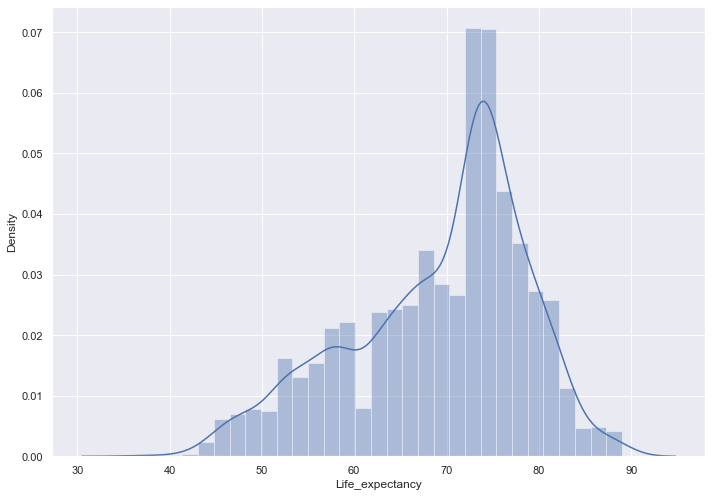

In [31]:
## istribution Plot for Life Expectancy
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.distplot(life_exp_df['Life_expectancy'])

##### Observation:

Distribution plot shows that life expectancy has high value around 72. This includes all the countries and for all the years.

##### Bar Chart

<AxesSubplot:xlabel='Status', ylabel='Life_expectancy'>

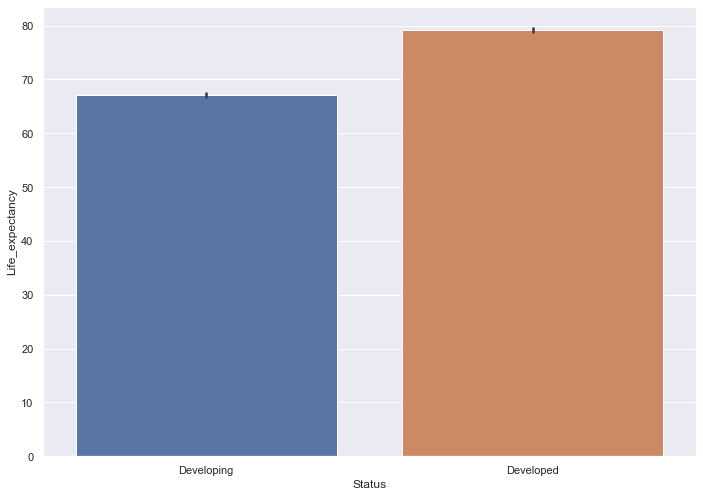

In [32]:
## Plotting bar graph by status
sns.set(font_scale=2.5)
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.barplot(life_exp_df["Status"],life_exp_df["Life_expectancy"])

##### Observation

The life expectancy is high for developing countries compared to developed countries. 

#### Life Expectancy vs features using Scatter Plot

In [33]:
features = ['Adult_Mortality', 'percentage_expenditure','Total_expenditure','under_five_deaths','BMI','Schooling']

for feature in features:
    title = '<b> Life Expectancy vs '+ feature + ' in every year'
    fig = px.scatter(life_exp_df.sort_values(by='Year'),y=feature,x='Life_expectancy',animation_frame='Year', 
                      animation_group='Country', color='Country',
                      size='Life_expectancy',template='plotly_dark',opacity=0.6, title=title)
    fig.show()

###### Observation

- <b>Life Expectancy vs Adult Mortality over years:</b> We see the adult mortality rate is low for developed countries compared to developing countries. Due to the development of medical in developing countries, the adult mortality rate has been increased over the period of time. However, the life expectancy has been increased and adult mortality has been decreased over years across the countries

- <b>Life Expectancy vs Percentage Expenditure over years:</b> The medical spending contribution by developing countries is low resulting in low life expectancy compared to the spending by developed countries which results in high life expectancy. I could see the same pattern for all the years.

- <b>Life Expectancy vs Total Expenditure in every years::</b> Most of the countries the total expenditure lies below 10 and only limited countries are having expenditure greater than 10.  Most of the values for life expectancy lies in the range of 40 and 90.United States is having high total expenditure and life expectancy. The life expectancy has been increased over years for all the countries

- <b>Life Expectancy vs under_five_deaths in every years::</b> Most of the countries are having the values less than 500. I also noticed that India is having high under 5 deaths. This might be due to population as India is the 2nd largest population country in the world. However, over the years, under five deaths has been reduced for India.

- <b>Life Expectance vs BMI in every years:</b> Over the years, the BMI across the countries has been increased which results in high life expectancy. This is because people are more cautious about their health now a days compared to older years.

- <b>Life Expectance vs Schooling in every years:</b> Schooling also plays a major role in improving life expectancy. The schooling gradually increases over years which results in high life expectancy. 

##### Regression Plot

In [34]:
num_cols

['Year',
 'Life_expectancy',
 'Adult_Mortality',
 'infant_deaths',
 'Alcohol',
 'percentage_expenditure',
 'Hepatitis_B',
 'Measles',
 'BMI',
 'under_five_deaths',
 'Polio',
 'Total_expenditure',
 'Diphtheria',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness_1_19_years',
 'thinness_5_9_years',
 'Income_composition_of_resources',
 'Schooling']

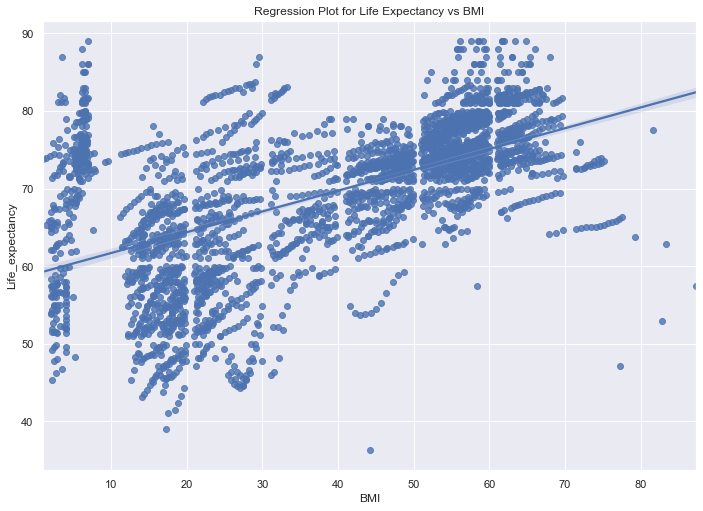

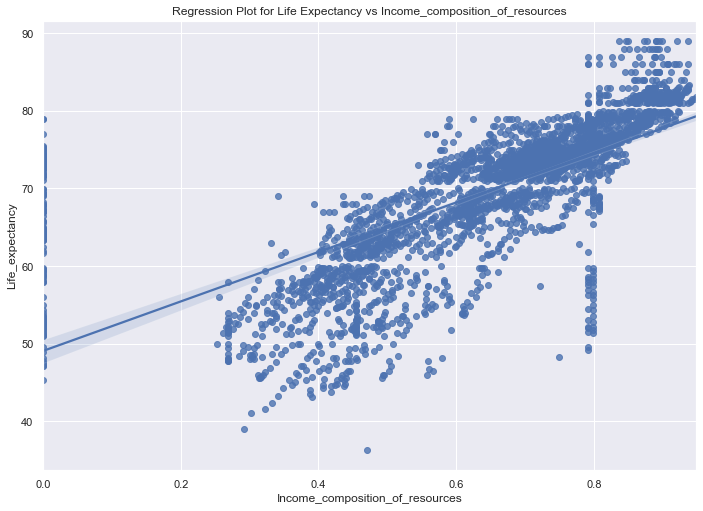

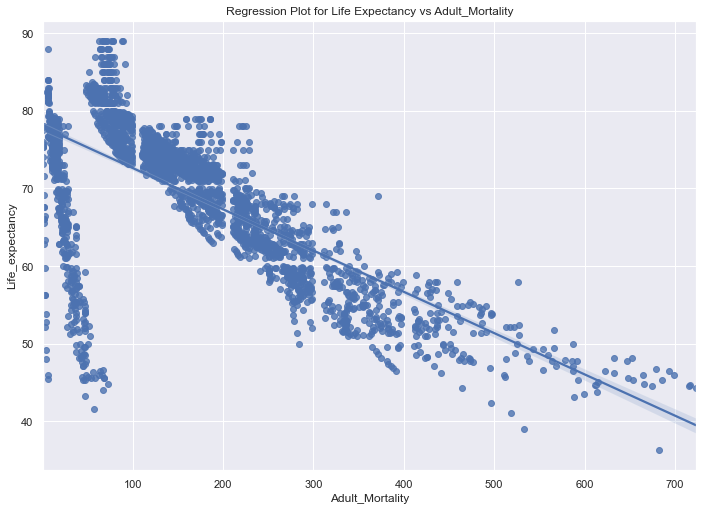

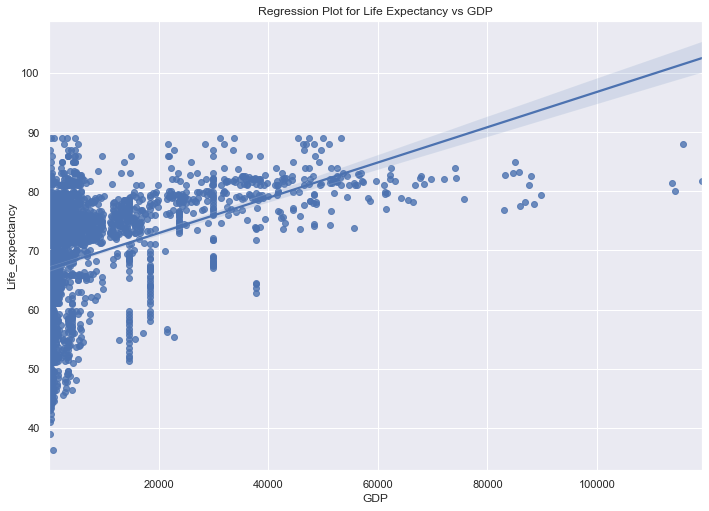

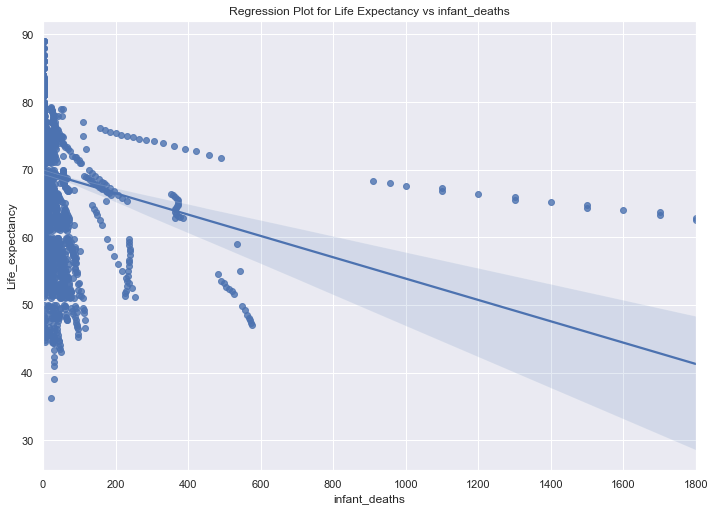

In [36]:
## Plotting regression plot

features = ['BMI','Income_composition_of_resources','Adult_Mortality','GDP',"infant_deaths"]
for i, feature in enumerate(features):
    plt.figure(i)
    title = "Regression Plot for Life Expectancy vs " + feature
    sns.regplot(x = feature, y = "Life_expectancy",data = life_exp_df).set(title = title)
    

##### Observation

I could see life expectancy increase for increase in BMI, GDP and income composition of resource and decrease for increase in adult mortality and infant deaths. All these scenarios are expected.

#### Heat Map

Text(0.5, 1.0, 'Heat Map')

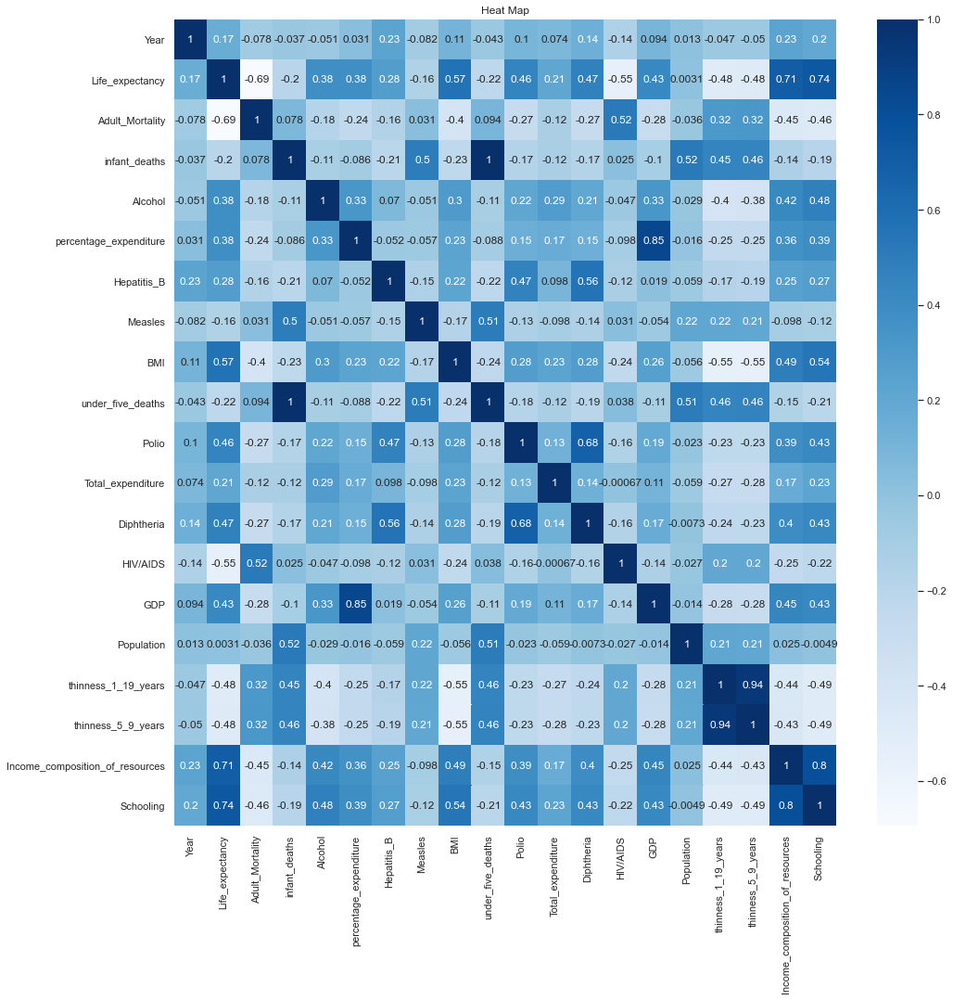

In [38]:
## Plotting heat map
plt.figure(figsize = (16 ,16))
sns.heatmap(life_exp_df.corr() ,cmap = 'Blues' , cbar = True , annot = True).set_title("Heat Map")

##### Observation

- Confirming our findings in the scatterplot above, Income composition resource and schooling features have strong correlation with our target variable Life Expectancy.

- Under five deaths is having strong correlation with measles; So, most of the deaths occurred due to measles; In addition, I also noticed that it is having positive correlation with population. This confirms my finding of scatter plot where India shows high under five deaths.  

- Adult mortality is having positive correlation with HIV/AID; So, most of the deaths occurred due to HIV/AIDS for adult people whose age ranges between 15 and 60.

- GDP is having positive correlation with percentage expenditure; So, the countries who spend high amount for medical results in higher GDP.

- Income composition of resource and schooling are having strong correlation of 0.8; The people who earns more results in sending  their children to school; 

- Diphtheria and Polio are having positive correlation; This might be due to the fact that children are given with both the vaacines during their earlier age to protect them against infections caused by diphtheria, tetanus (lockjaw), pertussis (whooping cough), and poliovirus

### Feature Engineering

#### Label Encoder

In [39]:
## Importing the LabelEncoder library
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [40]:
#### Copying the dataframe to another dataframe
life_df = life_exp_df.copy(deep=True)
life_df = life_df.drop(['iso_alpha'],axis=1)

In [41]:
## Printing the info
life_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life_expectancy                  2938 non-null   float64
 4   Adult_Mortality                  2938 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   Hepatitis_B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2938 non-null   float64
 11  under_five_deaths                2938 non-null   int64  
 12  Polio               

In [42]:
## Choosing categorical columns from the dataframe
cat_cols

['Country', 'Status']

In [43]:
## Converting categorical variables into numerical using label encoder
for col in cat_cols:
    life_df[col] = le.fit_transform(life_df[col])

In [44]:
## Printing the info of the table
life_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   int32  
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   int32  
 3   Life_expectancy                  2938 non-null   float64
 4   Adult_Mortality                  2938 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   Hepatitis_B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2938 non-null   float64
 11  under_five_deaths                2938 non-null   int64  
 12  Polio               

In [45]:
## Printing few records from the dataframe using head
life_df.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
0,0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,0,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,0,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,0,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,0,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


<AxesSubplot:>

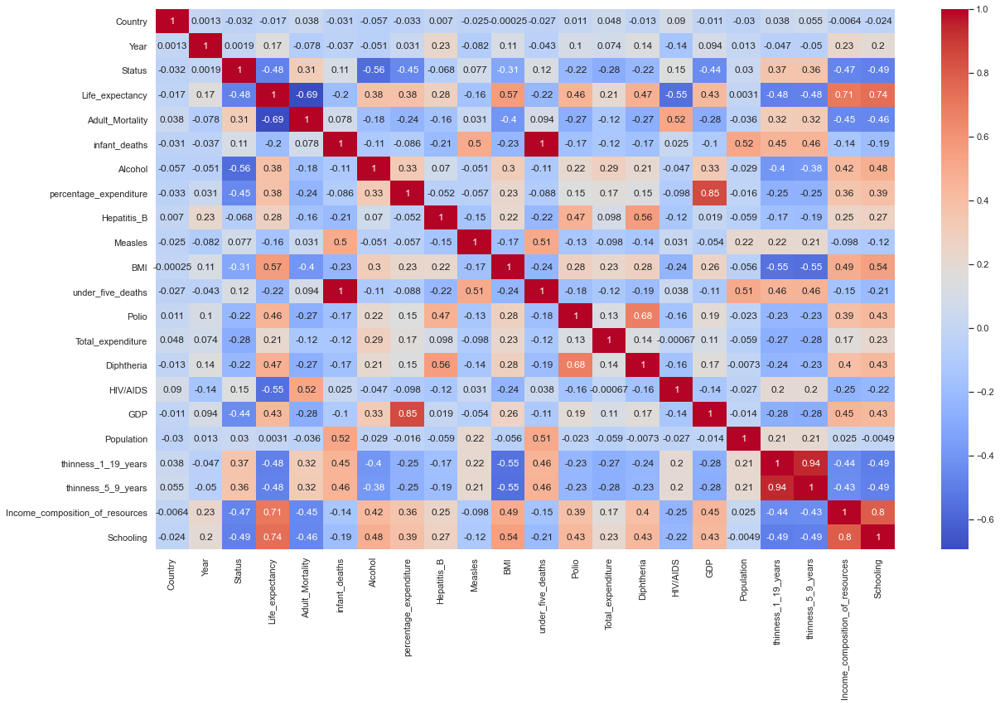

In [46]:
## Correlation matrix
corrmat = life_df.corr()
plt.figure(figsize=(20,12))
sns.heatmap(corrmat, annot=True, cmap='coolwarm')

In [47]:
## Printing the Correlation for income field 
corrmat['Life_expectancy'].sort_values(ascending = False)

Life_expectancy                    1.000000
Schooling                          0.736323
Income_composition_of_resources    0.705641
BMI                                0.567361
Diphtheria                         0.470947
Polio                              0.456336
GDP                                0.429252
percentage_expenditure             0.381847
Alcohol                            0.380721
Hepatitis_B                        0.284345
Total_expenditure                  0.212256
Year                               0.165457
Population                         0.003051
Country                           -0.017249
Measles                           -0.156446
infant_deaths                     -0.195148
under_five_deaths                 -0.221021
thinness_5_9_years                -0.480438
Status                            -0.481907
thinness_1_19_years               -0.484921
HIV/AIDS                          -0.553770
Adult_Mortality                   -0.694702
Name: Life_expectancy, dtype: fl

##### Observation

1. The target variable "Life Expectancy" is positively correlated with "Schooling", "Income_composition_of_resources", "BMI", "Diphtheria", "Polio", "GDP", "percentage_expenditure", "Alcohol", "Hepatitis_B","Total_expenditure"

2. The target variable is negatively correlated with "Adult Mortality", "HIV/AIDS", "thinness_1_19_years", "Status", "under_five_deaths", "thinness_5_9_years", "infant_deaths"

3. The above correlation is completely make sense as Life Expectancy would be higher if people are educated, took vaccines like Polio, Diphtheria, Hepatits B, Percentage_expenditure spent by the country, Total_expenditure and GDP of the countries. Negative correlation also makes sense for below reasons. 
    - HIV/AIDs cause people to die reducing the life expectancy
    - Adult Mortality is high
    - Infant deaths and under_five_deaths are high
    - Thinness_1_19_years and thinness_5_9_years are high

## Modeling

#### Linear Regression without Normalization

##### Running Linear Regression

In [48]:
## Creating source and target
X = life_df.drop(['Life_expectancy'],axis=1)
y = life_df['Life_expectancy']

In [49]:
## Verifying the shape of X and y
print("The shape of the input: {}".format(X.shape))
print("The shape of the target: {}".format(y.shape))

The shape of the input: (2938, 21)
The shape of the target: (2938,)


In [50]:
## Splitting the dataframe in train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [51]:
## Priting values from X_Train dataframe
X_train.head()

,Country,Year,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
456,27,2007,1,126.0,0,5.28,345.463714,96.0,0,25.5,0,98.0,4.30,98.0,0.6,3112.285712,486438.0,8.1,8.0,0.602,11.9
462,27,2001,1,152.0,0,3.81,150.743486,4.0,0,22.1,0,91.0,5.19,9.0,0.8,1268.884564,443716.0,9.4,9.3,0.562,11.0
2172,143,2011,1,143.0,0,10.43,0.000000,99.0,0,44.5,0,99.0,7.58,99.0,0.1,216.172747,82573.0,4.3,4.3,0.733,12.9
2667,175,2013,1,13.0,3,1.29,594.645310,98.0,16,59.3,3,98.0,7.26,98.0,0.1,4199.472530,1114558.0,6.4,6.3,0.720,14.7
381,23,2002,1,95.0,0,0.13,941.703687,99.0,0,28.0,0,99.0,3.40,94.0,0.1,16846.219800,175287587.0,6.7,6.1,0.820,13.3


In [52]:
## Printing the shape of train and test dataset
print("The shape of training dataset: {}".format(X_train.shape))
print("The shape of test dataset: {}".format(X_test.shape))

The shape of training dataset: (2350, 21)
The shape of test dataset: (588, 21)


The dataset has been successfully splitted into the test and train sets respectively. The division is purely random and each time we run the code, a new training set and testing set will be created. Let's run the resgressor algorithm on this training set and then see it's accuracy using the testing set!

##### Without Normalization

##### Linear Regression

In [53]:
## Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [54]:
## Printing Model Coefficients
print(model.coef_)

[ 3.68941251e-03 -1.19153627e-02 -1.54524383e+00 -1.97576342e-02
  9.73673509e-02  5.28558943e-02  1.89005818e-04 -1.66228776e-03
 -2.88986381e-05  3.80657199e-02 -7.27719326e-02  1.85332399e-02
  3.51793952e-02  3.19527843e-02 -4.73278416e-01  1.81808442e-05
  5.36201661e-10 -8.75784723e-02  3.26826255e-02  6.78062182e+00
  6.80990044e-01]


In [55]:
# Test the model by predicting on test data 
test_pred = model.predict(X_test)

In [56]:
## Printing predictions
test_pred

array([68.18315703, 76.89518468, 74.280269  , 77.35089904, 47.66390998,
       50.52995545, 68.14005762, 71.0563889 , 74.27246486, 55.13253305,
       52.22849446, 55.83448179, 64.77663372, 70.78199156, 71.03683742,
       62.9824121 , 55.9986225 , 80.99609461, 68.56983552, 82.00624411,
       81.7366845 , 84.78887226, 70.63506124, 68.84332359, 70.02389083,
       68.35864859, 61.25291712, 61.31165896, 78.99102843, 71.47367725,
       66.73708237, 75.07663319, 67.53926013, 68.47122441, 80.65107331,
       57.01907039, 67.01946088, 73.16192168, 62.56481729, 76.1848382 ,
       58.50121948, 64.40406096, 75.17653929, 81.56924868, 76.27390454,
       57.6987577 , 79.12514085, 70.69602804, 65.53980413, 67.64117515,
       55.11283953, 62.34650395, 78.14047409, 74.48812476, 73.21882996,
       59.82541811, 76.00042014, 70.44812926, 67.81883917, 69.20341096,
       78.35125255, 56.31378557, 73.92926024, 69.56050139, 53.28129012,
       52.82351537, 53.28150337, 79.73369548, 58.58233026, 78.33

In [57]:
print("Root Mean Square Error: {}".format(mean_squared_error(y_test, test_pred)))
print("R2 Score: {}".format(r2_score(y_test, test_pred)*100))

Root Mean Square Error: 14.263110163857739
R2 Score: 83.54823400752926


- R-squared value < 0.3 this value is generally considered a None or Very weak effect size,
- R-squared value 0.3 < r < 0.5 this value is generally considered a weak or low effect size,
- R-squared value 0.5 < r < 0.7 this value is generally considered a Moderate effect size,
- R-squared value r > 0.7 this value is generally considered strong effect size,

So, according to our current model, the accuracy that we have got is 83.548%, which is a pretty good score!

#### Plotting Actual vs Predicted

<AxesSubplot:xlabel='Life_expectancy'>

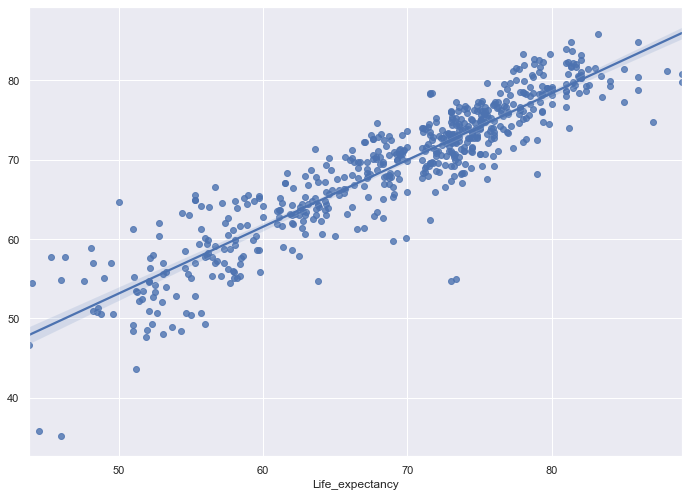

In [58]:
### Regression Plotting the outcome of the model
sns.regplot(x = y_test, y = model.predict(X_test))

#### Linear Regression with MinMaxScaler Normalization 

In [59]:
## Importing the library
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [60]:
## Normalizing the dataframe
life_df_norm = pd.DataFrame(scaler.fit_transform(life_df), columns=life_df.columns)
life_df_norm.head()

,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
0,0.0,1.000000,1.0,0.544592,0.362881,0.034444,0.0,0.003659,0.653061,0.005439,0.209733,0.0332,0.031250,0.452118,0.649485,0.0,0.004889,0.026074,0.619565,0.603509,0.505274,0.487923
1,0.0,0.933333,1.0,0.447818,0.373961,0.035556,0.0,0.003774,0.622449,0.002319,0.203940,0.0344,0.572917,0.453279,0.618557,0.0,0.005127,0.000253,0.630435,0.610526,0.502110,0.483092
2,0.0,0.866667,1.0,0.447818,0.369806,0.036667,0.0,0.003759,0.642857,0.002027,0.198146,0.0356,0.614583,0.450377,0.639175,0.0,0.005287,0.024525,0.637681,0.617544,0.495781,0.478261
3,0.0,0.800000,1.0,0.440228,0.375346,0.038333,0.0,0.004014,0.673469,0.013135,0.192352,0.0372,0.666667,0.473012,0.670103,0.0,0.005608,0.002857,0.644928,0.628070,0.488397,0.473430
4,0.0,0.733333,1.0,0.434535,0.379501,0.039444,0.0,0.000364,0.683673,0.014200,0.187717,0.0388,0.677083,0.435287,0.680412,0.0,0.000519,0.002302,0.655797,0.635088,0.478903,0.458937


In [61]:
## Defining source and target 
X_norm = life_df_norm.drop(['Life_expectancy'], axis =1 )
y_norm = life_df_norm['Life_expectancy']

In [62]:
## Printing the shape of source and target
print("The shape of source: {}".format(X_norm.shape))
print("The shape of target: {}".format(y_norm.shape))

The shape of source: (2938, 21)
The shape of target: (2938,)


In [63]:
## Splitting the dataframe in train and test
X_norm_train, X_norm_test, y_norm_train, y_norm_test = train_test_split(X_norm, y_norm, test_size = 0.2, random_state = 42)

In [64]:
## Priting values from X_Train dataframe
X_norm_train.head()

,Country,Year,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
456,0.140625,0.466667,1.0,0.173130,0.000000,0.295073,0.017734,0.969388,0.000000,0.283893,0.0000,0.989583,0.228091,0.989691,0.009901,0.026102,0.000376,0.289855,0.277193,0.635021,0.574879
462,0.140625,0.066667,1.0,0.209141,0.000000,0.212766,0.007738,0.030612,0.000000,0.244496,0.0000,0.916667,0.279745,0.072165,0.013861,0.010633,0.000343,0.336957,0.322807,0.592827,0.531401
2172,0.744792,0.733333,1.0,0.196676,0.000000,0.583427,0.000000,1.000000,0.000000,0.504056,0.0000,1.000000,0.418456,1.000000,0.000000,0.001800,0.000064,0.152174,0.147368,0.773207,0.623188
2667,0.911458,0.866667,1.0,0.016620,0.001667,0.071669,0.030526,0.989796,0.000075,0.675550,0.0012,0.989583,0.399884,0.989691,0.000000,0.035225,0.000861,0.228261,0.217544,0.759494,0.710145
381,0.119792,0.133333,1.0,0.130194,0.000000,0.006719,0.048342,1.000000,0.000000,0.312862,0.0000,1.000000,0.175856,0.948454,0.000000,0.141348,0.135477,0.239130,0.210526,0.864979,0.642512


In [65]:
## Printing the shape of train and test dataset
print("The shape of training dataset: {}".format(X_norm_train.shape))
print("The shape of test dataset: {}".format(X_norm_test.shape))

The shape of training dataset: (2350, 21)
The shape of test dataset: (588, 21)


MinMaxScaler has been applied on the dataset, and dataset has been successfully splitted into the test and train sets respectively. The division is purely random and each time we run the code, a new training set and testing set will be created. Let's run the resgressor algorithm on this training set and then see it's accuracy using the testing set!

#### Linear Regression with Normalization

In [66]:
## Linear Regression
model_norm = LinearRegression()
model_norm.fit(X_norm_train, y_norm_train)

LinearRegression()

In [67]:
## Printing Model Coefficients
print(model_norm.coef_)

[ 1.34415029e-02 -3.39146946e-03 -2.93215148e-02 -2.70683338e-01
  3.32564007e+00  1.79128325e-02  6.98636933e-02 -3.09116130e-03
 -1.16352936e-01  6.23353250e-02 -3.45217897e+00  3.37607407e-02
  1.15017264e-02  5.88125252e-02 -4.53521062e-01  4.11125328e-02
  1.31645064e-02 -4.58665244e-02  1.76746647e-02  1.21973994e-01
  2.67485653e-01]


In [68]:
# Test the model by predicting on test data 
test_norm_pred = model_norm.predict(X_norm_test)

In [69]:
## Printing predictions
test_norm_pred

array([ 0.60499349,  0.77030711,  0.72068822,  0.77895444,  0.21563397,
        0.27001813,  0.60417567,  0.65951402,  0.72054013,  0.35735357,
        0.30224847,  0.37067328,  0.54035358,  0.65430724,  0.65914303,
        0.50630763,  0.3737879 ,  0.84812324,  0.61233084,  0.86729116,
        0.86217618,  0.92009245,  0.65151919,  0.61752037,  0.63992203,
        0.6083235 ,  0.47348989,  0.47460453,  0.81007644,  0.66743221,
        0.57755375,  0.73579949,  0.59277533,  0.61045967,  0.84157634,
        0.39315124,  0.58291197,  0.6994672 ,  0.49838363,  0.75682805,
        0.42127551,  0.53328389,  0.73769524,  0.85899903,  0.75851811,
        0.40604853,  0.81262127,  0.65267605,  0.55483499,  0.59470921,
        0.35697988,  0.49424106,  0.79393689,  0.72463235,  0.70054706,
        0.44640262,  0.75332866,  0.64797209,  0.59808044,  0.62435315,
        0.79793648,  0.37976823,  0.71402771,  0.63112906,  0.32222562,
        0.31353919,  0.32222967,  0.82416879,  0.42281462,  0.79

In [70]:
print("Root Mean Square Error: {}".format(mean_squared_error(y_norm_test, test_norm_pred)))
print("R2 Score: {}".format(r2_score(y_norm_test, test_norm_pred)*100))

Root Mean Square Error: 0.00513562147410703
R2 Score: 83.54823400756966


<AxesSubplot:xlabel='Life_expectancy'>

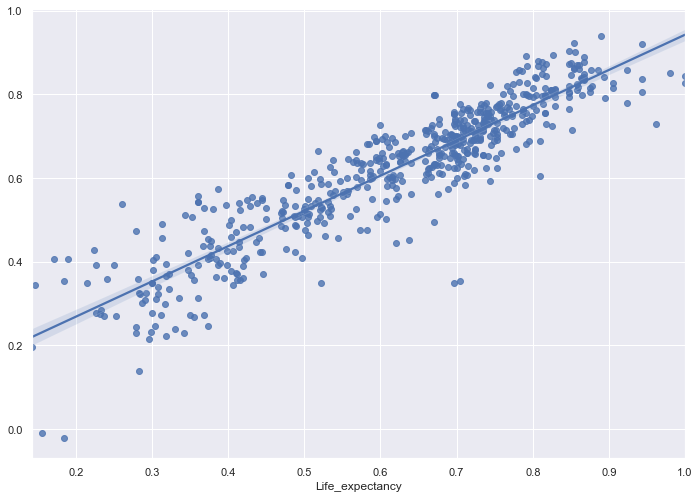

In [71]:
### Regression Plotting the outcome of the model
sns.regplot(x = y_norm_test, y = model_norm.predict(X_norm_test))

#### Observation:

The Root Mean square error has been reduced from 14.236 to 0.00513 after normalizing the dataset. However, the r2 score turned out to be the same (~83.548) as running linear regression without normalization.

### Feature Selection

#### StandardScalar

In [72]:
### Applying StandardScalar to the input dataset
## Apply standard Scalar to the dataset
sc = StandardScaler()
X_ss_train = pd.DataFrame(sc.fit_transform(X_train), columns = X_train.columns)
X_ss_test = pd.DataFrame(sc.transform(X_test), columns = X_test.columns)

In [73]:
## Displaying few records from StandardScalar dataset
X_ss_train.head()

,Country,Year,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
0,-1.222471,-0.116557,0.463109,-0.317973,-0.257514,0.170306,-0.192120,0.699278,-0.200110,-0.630633,-0.262215,0.659531,-0.643195,0.661437,-0.225454,-0.312242,-0.236713,0.702409,0.651028,-0.160142,-0.022097
1,-1.222471,-1.417792,0.463109,-0.110684,-0.257514,-0.194222,-0.291864,-2.517059,-0.200110,-0.798925,-0.262215,0.362184,-0.285755,-3.053771,-0.187469,-0.447196,-0.237546,0.989558,0.930736,-0.353045,-0.292866
2,0.841889,0.750932,0.463109,-0.182438,-0.257514,1.447394,-0.369082,0.804159,-0.200110,0.309824,-0.262215,0.702009,0.674111,0.703180,-0.320418,-0.524265,-0.244585,-0.136948,-0.145064,0.471615,0.278758
3,1.411368,1.184677,0.463109,-1.218884,-0.230683,-0.819127,-0.064479,0.769199,-0.198729,1.042390,-0.242595,0.659531,0.545594,0.661437,-0.320418,-0.232649,-0.224470,0.326907,0.285256,0.408922,0.820296
4,-1.293656,-1.200920,0.463109,-0.565126,-0.257514,-1.106781,0.113299,0.804159,-0.200110,-0.506888,-0.262215,0.702009,-1.004651,0.494461,-0.320418,0.693215,3.170477,0.393172,0.242224,0.891179,0.399100


#### Lasso Regression

In [74]:
# Create an instance of Lasso Regression implementation
lasso = Lasso(alpha=1.0)

In [75]:
# Fit the Lasso model
lasso.fit(X_ss_train, y_train)

Lasso()

In [76]:
# Create the model score
lasso.score(X_ss_test, y_test), lasso.score(X_ss_train, y_train)

(0.7868452107561621, 0.7742289353976738)

In [77]:
## Printing coefficient of the lasso
imp = lasso.coef_
imp

array([ 0.        ,  0.        , -0.29081616, -2.40872833, -0.        ,
        0.        ,  0.        ,  0.        , -0.        ,  0.58079753,
       -0.        ,  0.16020648,  0.        ,  0.51746363, -1.85516276,
        0.        , -0.        , -0.        , -0.        ,  1.52967366,
        2.51294607])

In [78]:
indices = []
for i in range(0, len(imp)):
    if imp[i] > 0:
        indices.append(i)
indices

[9, 11, 13, 19, 20]

In [79]:
## Printing the features corresponding to the index
for i in range(0, len(indices)):
    print(X_ss_train.columns[indices[i]])

BMI
Polio
Diphtheria
Income_composition_of_resources
Schooling


##### Observation

The best features identified by Lasso Regression are as below. This is same as what is identified by correlation matrix.

- BMI
- Polio
- Diphtheria
- Income_composition_of_resources
- Schooling

#### OLS Regression (Ordinary Least Square)

In [81]:
## Considering the normalized dataset (MinMaxScaler)
print("The shape of traning dataset: {}".format(X_norm_train.shape))
print("The shape of test dataset: {}".format(X_norm_test.shape))
print("The shape of target traning dataset: {}".format(y_norm_test.shape))
print("The shape of target test dataset: {}".format(y_norm_test.shape))

The shape of traning dataset: (2350, 21)
The shape of test dataset: (588, 21)
The shape of target traning dataset: (588,)
The shape of target test dataset: (588,)


In [82]:
## Showing few sample
X_norm_train.head()

,Country,Year,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
456,0.140625,0.466667,1.0,0.173130,0.000000,0.295073,0.017734,0.969388,0.000000,0.283893,0.0000,0.989583,0.228091,0.989691,0.009901,0.026102,0.000376,0.289855,0.277193,0.635021,0.574879
462,0.140625,0.066667,1.0,0.209141,0.000000,0.212766,0.007738,0.030612,0.000000,0.244496,0.0000,0.916667,0.279745,0.072165,0.013861,0.010633,0.000343,0.336957,0.322807,0.592827,0.531401
2172,0.744792,0.733333,1.0,0.196676,0.000000,0.583427,0.000000,1.000000,0.000000,0.504056,0.0000,1.000000,0.418456,1.000000,0.000000,0.001800,0.000064,0.152174,0.147368,0.773207,0.623188
2667,0.911458,0.866667,1.0,0.016620,0.001667,0.071669,0.030526,0.989796,0.000075,0.675550,0.0012,0.989583,0.399884,0.989691,0.000000,0.035225,0.000861,0.228261,0.217544,0.759494,0.710145
381,0.119792,0.133333,1.0,0.130194,0.000000,0.006719,0.048342,1.000000,0.000000,0.312862,0.0000,1.000000,0.175856,0.948454,0.000000,0.141348,0.135477,0.239130,0.210526,0.864979,0.642512


In [83]:
# Adds a constant term to the predictor
x_ols = sm.add_constant(X_norm_train)

In [84]:
## showing few records in x_ols
x_ols.head()

,const,Country,Year,Status,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness_1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
456,1.0,0.140625,0.466667,1.0,0.173130,0.000000,0.295073,0.017734,0.969388,0.000000,0.283893,0.0000,0.989583,0.228091,0.989691,0.009901,0.026102,0.000376,0.289855,0.277193,0.635021,0.574879
462,1.0,0.140625,0.066667,1.0,0.209141,0.000000,0.212766,0.007738,0.030612,0.000000,0.244496,0.0000,0.916667,0.279745,0.072165,0.013861,0.010633,0.000343,0.336957,0.322807,0.592827,0.531401
2172,1.0,0.744792,0.733333,1.0,0.196676,0.000000,0.583427,0.000000,1.000000,0.000000,0.504056,0.0000,1.000000,0.418456,1.000000,0.000000,0.001800,0.000064,0.152174,0.147368,0.773207,0.623188
2667,1.0,0.911458,0.866667,1.0,0.016620,0.001667,0.071669,0.030526,0.989796,0.000075,0.675550,0.0012,0.989583,0.399884,0.989691,0.000000,0.035225,0.000861,0.228261,0.217544,0.759494,0.710145
381,1.0,0.119792,0.133333,1.0,0.130194,0.000000,0.006719,0.048342,1.000000,0.000000,0.312862,0.0000,1.000000,0.175856,0.948454,0.000000,0.141348,0.135477,0.239130,0.210526,0.864979,0.642512


In [85]:
## Fitting ols regression
result_ols = sm.OLS(y_norm_train, X_norm_train).fit()

In [86]:
## Printing result summary
print(result_ols.summary())

                                 OLS Regression Results                                
Dep. Variable:        Life_expectancy   R-squared (uncentered):                   0.981
Model:                            OLS   Adj. R-squared (uncentered):              0.981
Method:                 Least Squares   F-statistic:                              5759.
Date:                Fri, 14 Oct 2022   Prob (F-statistic):                        0.00
Time:                        18:47:09   Log-Likelihood:                          2337.7
No. Observations:                2350   AIC:                                     -4633.
Df Residuals:                    2329   BIC:                                     -4512.
Df Model:                          21                                                  
Covariance Type:            nonrobust                                                  
                                      coef    std err          t      P>|t|      [0.025      0.975]
--------------------

Now, if we consider that a good p value would be a one greater than 0.05 or within 5%, then the attributes or features that we can considered as best features are:

- Year
- Hepatitis_B
- GDP
- Population
- thinness_1_19_years
- thinness_5_9_years
- Percentage_expenditure